## 8. Random Forest Model

### 1. Importing libraries

### 2. Importing data

### 3. Data wrangling

### 4. Creating subsets

### 5. Checking the number of entries per station

### 6. Dropping columns

### 7. Data splitting

### 8. Random forest model

### 9. Kassel - Subset and random forest model

### 10. Belgrade - Subset and random forest model

### 11. Valentia - Subset and random forest model

#### 1. Importing libraries

In [3]:
# Importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree

#### 2. Importing data

In [5]:
path = r'C:\Users\Priya\OneDrive\Documents\CareerFoundry\Machine Learning'

In [6]:
path

'C:\\Users\\Priya\\OneDrive\\Documents\\CareerFoundry\\Machine Learning'

In [7]:
# Importing the cleaned weather observations data set
climate_cleaned = pd.read_csv(os.path.join(path, 'Achievement 2', 'Data Sets', 'weather_cleaned.csv'), index_col = False)

In [8]:
# Checking the shape of the dataframe
climate_cleaned.shape

(22950, 136)

In [9]:
# Viewing the first five rows of the dataframe
climate_cleaned.head()

,Unnamed: 0,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,0,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,1,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,2,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,3,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,10.6,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,4,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,6.0,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [10]:
# Dropping the Unnamed: 0 column
climate_cleaned = climate_cleaned.drop(['Unnamed: 0'], axis=1)

In [11]:
# Checking the shape of the dataframe
climate_cleaned.shape

(22950, 135)

In [12]:
# Checking if the Unnamed: 0 column was dropped
climate_cleaned.head()

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,1,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1,6,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9,6,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,10.6,8,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,6.0,8,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [13]:
# Importing the pleasant weather dataset
pleasantweather = pd.read_csv(os.path.join(path, 'Achievement 1', 'Data Sets', 'Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'), index_col = False)

In [14]:
# Checking the shape of the pleasantweather dataset
pleasantweather.shape

(22950, 16)

In [15]:
# Viewing the first five rows of the pleasant weather dataset
pleasantweather.head()

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [16]:
# Importing the original ClimateWins dataset to copy the DATE and MONTH columns to the climate_cleaned dataset
climate = pd.read_csv(os.path.join(path, 'Achievement 1', 'Data Sets', 'Dataset-weather-prediction-dataset-processed.csv'), index_col = False)

In [17]:
# Checking the shape of the climate dataframe
climate.shape

(22950, 170)

In [18]:
# Viewing the first five rows of the climate dataframe
climate.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,7,2.1,0.85,1.018,0.32,0.09,0,0.7,...,5,0.88,1.0003,0.45,0.34,0,4.7,8.5,6.0,10.9
1,19600102,1,6,2.1,0.84,1.018,0.36,1.05,0,1.1,...,7,0.91,1.0007,0.25,0.84,0,0.7,8.9,5.6,12.1
2,19600103,1,8,2.1,0.90,1.018,0.18,0.30,0,0.0,...,7,0.91,1.0096,0.17,0.08,0,0.1,10.5,8.1,12.9
3,19600104,1,3,2.1,0.92,1.018,0.58,0.00,0,4.1,...,7,0.86,1.0184,0.13,0.98,0,0.0,7.4,7.3,10.6
4,19600105,1,6,2.1,0.95,1.018,0.65,0.14,0,5.4,...,3,0.80,1.0328,0.46,0.00,0,5.7,5.7,3.0,8.4


#### 3. Data wrangling

In [20]:
# Adding the DATE and MONTH columns from climate to climate_cleaned since climate_cleaned does not have these columns
climate_cleaned[['DATE', 'MONTH']] = climate[['DATE', 'MONTH']].copy()

In [21]:
# Checking if the DATE and MONTH columns were added to climate_cleaned
climate_cleaned.head()

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,DATE,MONTH
0,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,1,...,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9,19600101,1
1,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1,6,...,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1,19600102,1
2,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9,6,...,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9,19600103,1
3,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,10.6,8,...,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6,19600104,1
4,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,6.0,8,...,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4,19600105,1


#### 4. Creating subsets

In [23]:
# Creating a subset with data from 2011-2021
climatedecade = climate_cleaned[(climate_cleaned['DATE'].astype(str).str[:4] >= '2011') & (climate_cleaned['DATE'].astype(str).str[:4] < '2021')]
climatedecade

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,DATE,MONTH
18628,8,0.97,1.0232,0.13,0.00,0.0,-0.2,-0.8,0.3,4,...,0.82,1.0142,0.13,0.41,3.4,10.7,7.9,6.6,20110101,1
18629,8,0.94,1.0234,0.13,0.00,0.0,-0.2,-3.9,1.4,8,...,0.82,1.0142,0.15,0.41,3.4,10.7,7.9,5.4,20110102,1
18630,4,0.93,1.0254,0.64,0.00,6.1,-3.3,-5.2,-0.9,7,...,0.82,1.0142,0.17,0.41,3.4,10.7,7.9,4.5,20110103,1
18631,6,0.89,1.0208,0.38,0.00,1.0,-3.6,-5.8,-1.9,4,...,0.82,1.0142,0.22,0.41,3.4,10.7,7.9,7.9,20110104,1
18632,5,0.79,1.0142,0.64,0.06,6.5,-0.8,-5.4,2.5,1,...,0.82,1.0142,0.23,0.41,3.4,10.7,7.9,7.8,20110105,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,8,0.70,1.0007,0.26,0.41,0.0,1.7,-3.6,9.9,7,...,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,20201227,12
22277,7,0.74,0.9828,0.26,0.11,0.4,4.6,1.9,8.1,4,...,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,20201228,12
22278,6,0.74,0.9945,0.25,0.22,0.2,4.4,1.6,6.9,2,...,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,20201229,12
22279,6,0.85,1.0069,0.32,0.04,0.3,2.6,0.5,4.9,7,...,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,20201230,12


In [24]:
# Creating a subset of the pleasantweather data set with data from 2011-2021
pleasantweatherdecade = pleasantweather[(pleasantweather['DATE'].astype(str).str[:4] >= '2011') & (pleasantweather['DATE'].astype(str).str[:4] < '2021')]
pleasantweatherdecade

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
18628,20110101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18629,20110102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18630,20110103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18631,20110104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18632,20110105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,20201227,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22277,20201228,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22278,20201229,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22279,20201230,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


#### 5. Checking the number of entries per station

In [26]:
# Removing the limit on the number of rows that can be shown
pd.options.display.max_rows = None

In [27]:
# Extracting a list of weather station names
stations = [col.split('_')[0] for col in climatedecade.columns if '_' in col]

In [28]:
# Converting the list of stations into a set and viewing the set
unique_stations = set(stations)
unique_stations

{'BASEL',
 'BELGRADE',
 'BUDAPEST',
 'DEBILT',
 'DUSSELDORF',
 'HEATHROW',
 'KASSEL',
 'LJUBLJANA',
 'MAASTRICHT',
 'MADRID',
 'MUNCHENB',
 'OSLO',
 'SONNBLICK',
 'STOCKHOLM',
 'VALENTIA'}

In [29]:
# Creating station_entries to store the number of entries for each station
station_entries = {}

for station in unique_stations:
    # Selecting columns for each station
    station_columns = [col for col in climatedecade.columns if col.startswith(station)]
    
    # Counting non-missing entries for each station
    station_entries[station] =  climatedecade[station_columns].notna().sum().sum()

In [30]:
# Printing the number of entries for each station
print("Number of entries for each weather station:")
for station, freq in station_entries.items():
    print(f"{station}: {freq}")

Number of entries for each weather station:
KASSEL: 32877
MUNCHENB: 32877
HEATHROW: 32877
LJUBLJANA: 32877
SONNBLICK: 32877
DEBILT: 32877
STOCKHOLM: 32877
DUSSELDORF: 32877
BELGRADE: 32877
OSLO: 32877
VALENTIA: 32877
MADRID: 32877
BUDAPEST: 32877
MAASTRICHT: 32877
BASEL: 32877


#### 6. Dropping columns

In [32]:
# Dropping the DATE and MONTH columns from the climatedecade dataframe
climatedecade = climatedecade.drop(['DATE', 'MONTH'], axis=1)

In [33]:
# Checking the shape of the climatedecade dataframe
climatedecade.shape

(3653, 135)

In [34]:
# Checking if the DATE and MONTH columns were dropped from climatedecade
climatedecade.head()

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
18628,8,0.97,1.0232,0.13,0.00,0.0,-0.2,-0.8,0.3,4,...,-0.5,5,0.82,1.0142,0.13,0.41,3.4,10.7,7.9,6.6
18629,8,0.94,1.0234,0.13,0.00,0.0,-0.2,-3.9,1.4,8,...,-2.4,5,0.82,1.0142,0.15,0.41,3.4,10.7,7.9,5.4
18630,4,0.93,1.0254,0.64,0.00,6.1,-3.3,-5.2,-0.9,7,...,-2.6,5,0.82,1.0142,0.17,0.41,3.4,10.7,7.9,4.5
18631,6,0.89,1.0208,0.38,0.00,1.0,-3.6,-5.8,-1.9,4,...,-5.6,5,0.82,1.0142,0.22,0.41,3.4,10.7,7.9,7.9
18632,5,0.79,1.0142,0.64,0.06,6.5,-0.8,-5.4,2.5,1,...,-0.2,5,0.82,1.0142,0.23,0.41,3.4,10.7,7.9,7.8


In [35]:
# Dropping the DATE column from the pleasantweatherdecade dataframe
pleasantweatherdecade = pleasantweatherdecade.drop(['DATE'], axis=1)

In [36]:
# Checking the shape of pleasantweatherdecade
pleasantweatherdecade.shape

(3653, 15)

In [37]:
# Checking if the DATE column was dropped from pleasantweatherdecade
pleasantweatherdecade.head()

,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
18628,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18629,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18630,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18631,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18632,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [38]:
# Renaming the climatedecade and pleasantweatherdecade dataframes to X and y, respectively
X = climatedecade
y = pleasantweatherdecade

In [39]:
# Converting X and Y into arrays
X = np.array(X)
y = np.array(y)

In [40]:
# Viewing X
X

array([[ 8.    ,  0.97  ,  1.0232, ..., 10.7   ,  7.9   ,  6.6   ],
       [ 8.    ,  0.94  ,  1.0234, ..., 10.7   ,  7.9   ,  5.4   ],
       [ 4.    ,  0.93  ,  1.0254, ..., 10.7   ,  7.9   ,  4.5   ],
       ...,
       [ 6.    ,  0.74  ,  0.9945, ..., 10.7   ,  7.9   , 13.5   ],
       [ 6.    ,  0.85  ,  1.0069, ..., 10.7   ,  7.9   , 13.5   ],
       [ 7.    ,  0.86  ,  1.0069, ..., 10.7   ,  7.9   , 13.5   ]])

In [41]:
# Viewing y
y

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [42]:
# Checking the shape of X
X.shape

(3653, 135)

In [43]:
# Checking the shape of y
y.shape

(3653, 15)

#### 7. Data splitting

In [45]:
# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [46]:
# Printing the shapes of X_train, X_test, y_train, and y_test
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(2739, 135) (2739, 15)
(914, 135) (914, 15)


#### 8. Random forest model

In [86]:
# Creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [88]:
# Performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.6028446389496718


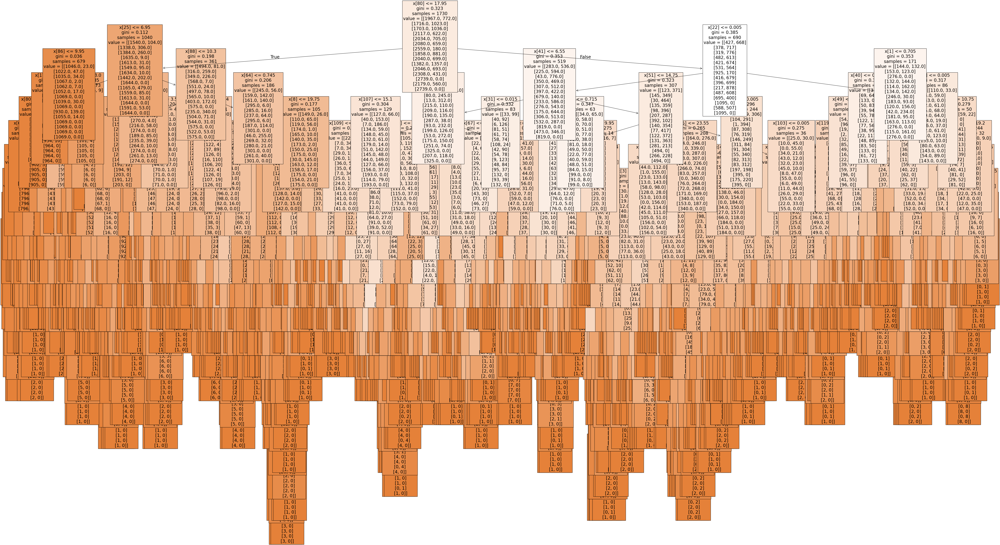

In [98]:
# Plotting a tree
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, class_names=unique_stations, filled=True);

In [100]:
# Saving the tree
fig.savefig(os.path.join(path, 'Achievement 2', 'random_forest_decade.png'), bbox_inches='tight')

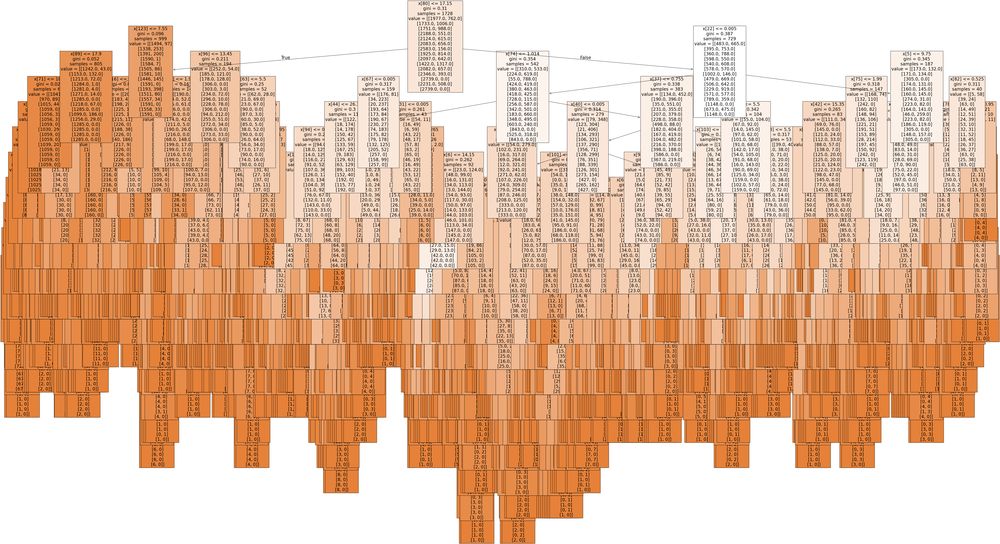

In [102]:
# Plotting a tree with 99 estimators
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[99], fontsize = 20, class_names=unique_stations, filled=True);

In [104]:
# Saving the tree
fig.savefig(os.path.join(path, 'Achievement 2', 'random_forest_decade_2.png'), bbox_inches='tight')

In [106]:
# Obtaining feature importances of the model
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
# print(clf.feature_importances_.shape)
newarray

array([3.01256740e-03, 3.88141425e-03, 3.22295647e-03, 3.34013817e-03,
       1.91241277e-02, 8.85179602e-03, 1.95546692e-02, 5.52693846e-03,
       3.77587408e-02, 4.51150203e-03, 2.82736140e-03, 4.08567687e-03,
       2.80823619e-03, 1.98513730e-02, 3.31330977e-03, 7.60262421e-03,
       5.72056262e-03, 1.09761990e-02, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 8.77410748e-04, 1.48897259e-02, 1.11831679e-03,
       2.29800881e-02, 6.61116793e-03, 2.13005043e-02, 3.12289185e-03,
       3.31707515e-03, 5.25018416e-03, 4.66475566e-03, 1.71642730e-02,
       6.02584878e-03, 1.01686754e-02, 3.10869315e-03, 4.08589778e-02,
       2.26749922e-03, 3.74577044e-03, 5.11376157e-03, 3.72556402e-03,
       1.95777683e-02, 7.91080026e-03, 1.62324572e-02, 2.73209641e-03,
       3.03768103e-02, 2.51937540e-03, 4.44208644e-03, 4.18624733e-03,
       4.64065916e-03, 1.05278247e-02, 4.68954322e-03, 8.08103983e-03,
       3.07193474e-03, 1.28080468e-02, 2.57635770e-03, 2.31445537e-03,
      

In [108]:
# Checking the shape of newarray
newarray.shape

(135,)

In [110]:
# Setting the printing threshold to 1000
np.set_printoptions(threshold=1000)

In [112]:
# Reshaping newarray
newarray = newarray.reshape(-1,15,9)
print(newarray.shape)
newarray

(1, 15, 9)


array([[[3.01256740e-03, 3.88141425e-03, 3.22295647e-03, 3.34013817e-03,
         1.91241277e-02, 8.85179602e-03, 1.95546692e-02, 5.52693846e-03,
         3.77587408e-02],
        [4.51150203e-03, 2.82736140e-03, 4.08567687e-03, 2.80823619e-03,
         1.98513730e-02, 3.31330977e-03, 7.60262421e-03, 5.72056262e-03,
         1.09761990e-02],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 8.77410748e-04,
         1.48897259e-02, 1.11831679e-03, 2.29800881e-02, 6.61116793e-03,
         2.13005043e-02],
        [3.12289185e-03, 3.31707515e-03, 5.25018416e-03, 4.66475566e-03,
         1.71642730e-02, 6.02584878e-03, 1.01686754e-02, 3.10869315e-03,
         4.08589778e-02],
        [2.26749922e-03, 3.74577044e-03, 5.11376157e-03, 3.72556402e-03,
         1.95777683e-02, 7.91080026e-03, 1.62324572e-02, 2.73209641e-03,
         3.03768103e-02],
        [2.51937540e-03, 4.44208644e-03, 4.18624733e-03, 4.64065916e-03,
         1.05278247e-02, 4.68954322e-03, 8.08103983e-03, 3.07193474

In [114]:
# Collapsing the shape into one observation for each weather station
sumarray = np.sum(newarray[0], axis=1)
sumarray

array([0.10427335, 0.06169685, 0.06777721, 0.09368137, 0.09168253,
       0.05496676, 0.02232034, 0.08082122, 0.10043224, 0.06734816,
       0.095661  , 0.07035138, 0.03297734, 0.05322271, 0.00278755])

In [116]:
# Checking the shape of sumarray
sumarray.shape

(15,)

In [118]:
# Converting unique_stations to a list from a set
unique_stations = list(unique_stations)

In [120]:
# Obtaining the importances of each weather station
important = pd.Series(sumarray, index = unique_stations)
important

KASSEL        0.104273
MUNCHENB      0.061697
HEATHROW      0.067777
LJUBLJANA     0.093681
SONNBLICK     0.091683
DEBILT        0.054967
STOCKHOLM     0.022320
DUSSELDORF    0.080821
BELGRADE      0.100432
OSLO          0.067348
VALENTIA      0.095661
MADRID        0.070351
BUDAPEST      0.032977
MAASTRICHT    0.053223
BASEL         0.002788
dtype: float64

['KASSEL', 'MUNCHENB', 'HEATHROW', 'LJUBLJANA', 'SONNBLICK', 'DEBILT', 'STOCKHOLM', 'DUSSELDORF', 'BELGRADE', 'OSLO', 'VALENTIA', 'MADRID', 'BUDAPEST', 'MAASTRICHT', 'BASEL']


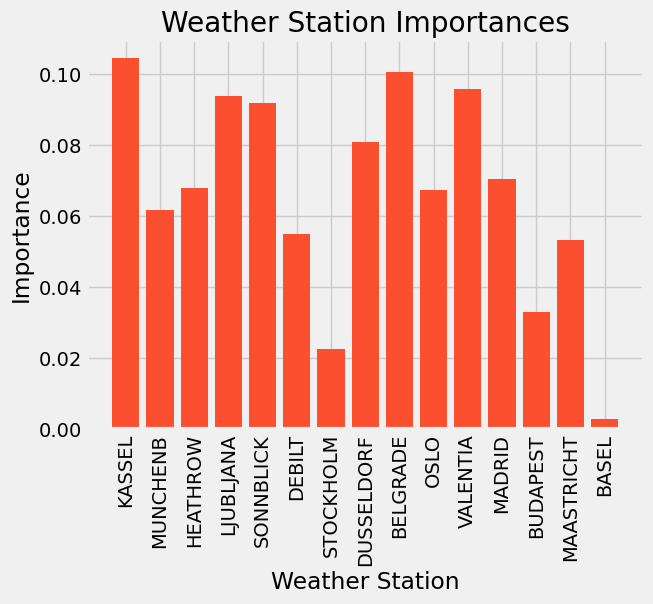

In [124]:
# Creating a bar chart of the importances of each weather station
%matplotlib inline

plt.style.use('fivethirtyeight')
x_values = list(range(len(important)))
print(unique_stations)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, unique_stations, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Weather Station'); plt.title('Weather Station Importances');
plt.show()

In [129]:
# Saving the bar chart
plt.savefig(os.path.join(path, 'Achievement 2', 'weather_station_importances.png'), bbox_inches='tight')

The stations with the most influence are Kassel, Belgrade, and Valentia.

#### 9. Kassel - Subset and random forest model

In [136]:
# Obtaining a list of columns in the climate dataset
list(climate)

['DATE',
 'MONTH',
 'BASEL_cloud_cover',
 'BASEL_wind_speed',
 'BASEL_humidity',
 'BASEL_pressure',
 'BASEL_global_radiation',
 'BASEL_precipitation',
 'BASEL_snow_depth',
 'BASEL_sunshine',
 'BASEL_temp_mean',
 'BASEL_temp_min',
 'BASEL_temp_max',
 'BELGRADE_cloud_cover',
 'BELGRADE_humidity',
 'BELGRADE_pressure',
 'BELGRADE_global_radiation',
 'BELGRADE_precipitation',
 'BELGRADE_sunshine',
 'BELGRADE_temp_mean',
 'BELGRADE_temp_min',
 'BELGRADE_temp_max',
 'BUDAPEST_cloud_cover',
 'BUDAPEST_humidity',
 'BUDAPEST_pressure',
 'BUDAPEST_global_radiation',
 'BUDAPEST_precipitation',
 'BUDAPEST_sunshine',
 'BUDAPEST_temp_mean',
 'BUDAPEST_temp_min',
 'BUDAPEST_temp_max',
 'DEBILT_cloud_cover',
 'DEBILT_wind_speed',
 'DEBILT_humidity',
 'DEBILT_pressure',
 'DEBILT_global_radiation',
 'DEBILT_precipitation',
 'DEBILT_sunshine',
 'DEBILT_temp_mean',
 'DEBILT_temp_min',
 'DEBILT_temp_max',
 'DUSSELDORF_cloud_cover',
 'DUSSELDORF_wind_speed',
 'DUSSELDORF_humidity',
 'DUSSELDORF_pressure',
 

In [138]:
# Creating a subset with the columns for Kassel
climate_kassel = climate[['KASSEL_wind_speed', 'KASSEL_humidity', 'KASSEL_pressure', 'KASSEL_global_radiation', 'KASSEL_precipitation', 'KASSEL_sunshine',
 'KASSEL_temp_mean', 'KASSEL_temp_min', 'KASSEL_temp_max']]

In [140]:
# Viewing the first five rows of climate_kassel
climate_kassel.head()

,KASSEL_wind_speed,KASSEL_humidity,KASSEL_pressure,KASSEL_global_radiation,KASSEL_precipitation,KASSEL_sunshine,KASSEL_temp_mean,KASSEL_temp_min,KASSEL_temp_max
0,2.9,0.82,1.0094,0.28,0.48,1.6,7.9,3.9,9.4
1,1.9,0.86,1.0086,0.12,0.27,0.0,7.7,6.8,9.1
2,1.3,0.91,1.0129,0.12,0.60,0.0,6.5,6.0,8.0
3,1.4,0.87,1.0290,0.12,0.00,0.0,5.8,5.2,6.5
4,2.9,0.86,1.0262,0.13,0.71,0.0,5.4,3.7,6.0


In [142]:
# Checking the shape of climate_kassel
climate_kassel.shape

(22950, 9)

In [146]:
# Renaming climate_kassel as X and creating y with the column for Kassel from pleasantweather
X = climate_kassel
y = pleasantweather['KASSEL_pleasant_weather']

In [148]:
# Converting X and Y into arrays
X = np.array(X)
y = np.array(y)

In [150]:
# Checking the shape of X
X.shape

(22950, 9)

In [152]:
# Checking the shape of y
y.shape

(22950,)

In [154]:
# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [156]:
# Printing the shapes of X_train, X_test, y_train, and y_test
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [158]:
# Creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [160]:
# Performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


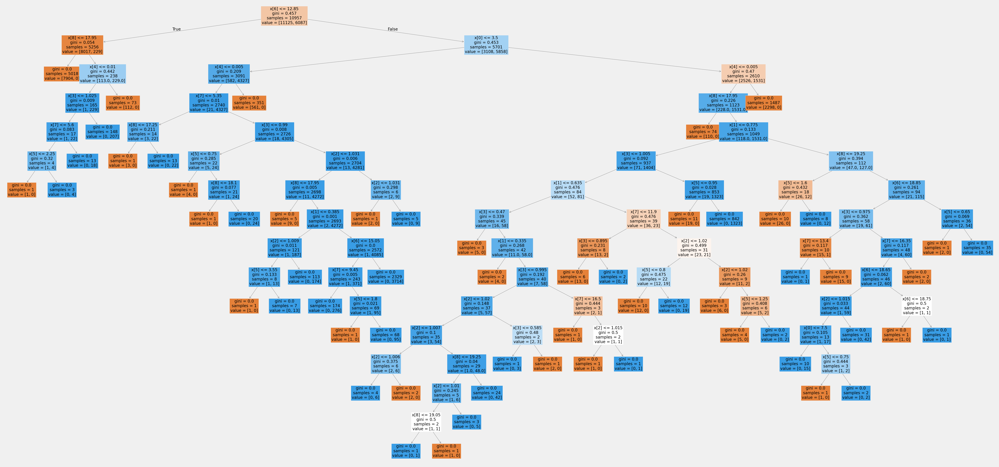

In [214]:
# Plotting one decision tree
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[10], fontsize = 20, filled=True);
plt.show()

In [216]:
# Saving the tree
fig.savefig(os.path.join(path, 'Achievement 2', 'decision_tree_Kassel.png'), bbox_inches='tight')

In [170]:
# Obtaining feature importances of the model
newarray = clf.feature_importances_
newarray

array([0.00386616, 0.02514394, 0.01691803, 0.09792264, 0.32762817,
       0.08482612, 0.14230523, 0.02263828, 0.27875144])

In [172]:
# Checking the shape of newarray
newarray.shape

(9,)

In [174]:
# Creating a list of observations for Kassel
kassel_observations = ['wind_speed', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']
kassel_observations

['wind_speed',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [178]:
# Obtaining the importances of each observation for Kassel
important = pd.Series(newarray, index = kassel_observations)
important

wind_speed          0.003866
humidity            0.025144
pressure            0.016918
global_radiation    0.097923
precipitation       0.327628
sunshine            0.084826
temp_mean           0.142305
temp_min            0.022638
temp_max            0.278751
dtype: float64

['wind_speed', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


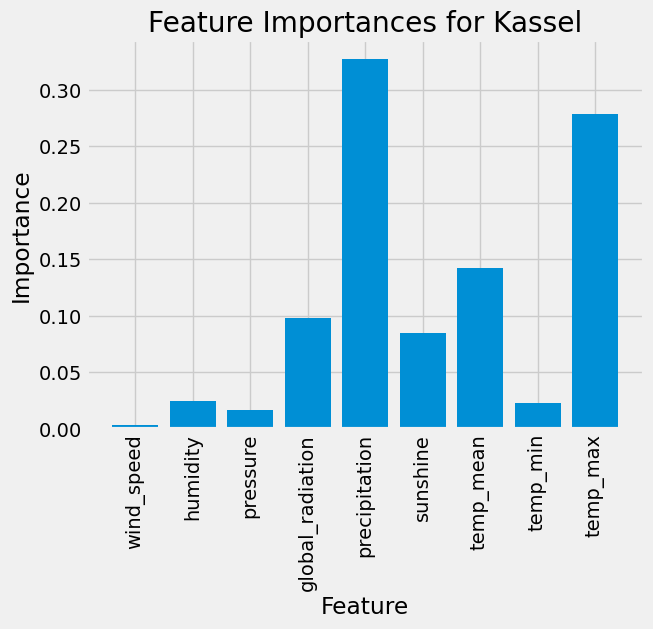

In [180]:
# Creating a bar chart of the importances of each observation for Kassel
%matplotlib inline

plt.style.use('fivethirtyeight')
x_values = list(range(len(important)))
print(kassel_observations)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, kassel_observations, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Feature'); plt.title('Feature Importances for Kassel');
plt.show()

In [182]:
# Saving the bar chart
plt.savefig(os.path.join(path, 'Achievement 2', 'importances_Kassel.png'), bbox_inches='tight')

#### 10. Belgrade - Subset and random forest model

In [185]:
# Creating a subset with the columns for Belgrade
climate_belgrade = climate[['BELGRADE_cloud_cover', 'BELGRADE_humidity', 'BELGRADE_pressure', 'BELGRADE_global_radiation', 'BELGRADE_precipitation',
 'BELGRADE_sunshine', 'BELGRADE_temp_mean', 'BELGRADE_temp_min', 'BELGRADE_temp_max',]]

In [187]:
# Viewing the first five rows of climate_belgrade
climate_belgrade.head()

,BELGRADE_cloud_cover,BELGRADE_humidity,BELGRADE_pressure,BELGRADE_global_radiation,BELGRADE_precipitation,BELGRADE_sunshine,BELGRADE_temp_mean,BELGRADE_temp_min,BELGRADE_temp_max
0,1,0.81,1.0195,0.88,0.00,7.0,3.7,-0.9,7.9
1,6,0.84,1.0172,0.25,0.00,0.0,2.9,2.2,4.4
2,6,0.77,1.0179,0.67,0.00,3.5,3.1,-0.5,6.4
3,8,0.93,1.0268,0.25,0.00,0.0,2.0,-2.0,3.0
4,8,0.99,1.0286,0.25,0.06,0.0,2.0,0.7,2.8


In [189]:
# Checking the shape of climate_belgrade
climate_belgrade.shape

(22950, 9)

In [192]:
# Renaming climate_belgrade as X and creating y with the columns for Belgrade from pleasantweather
X = climate_belgrade
y = pleasantweather['BELGRADE_pleasant_weather']

In [194]:
# Converting X and Y into arrays
X = np.array(X)
y = np.array(y)

In [196]:
# Checking the shape of X
X.shape

(22950, 9)

In [198]:
# Checking the shape of y
y.shape

(22950,)

In [200]:
# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [202]:
# Printing the shapes of X_train, X_test, y_train, and y_test
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [204]:
# Creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [206]:
# Performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


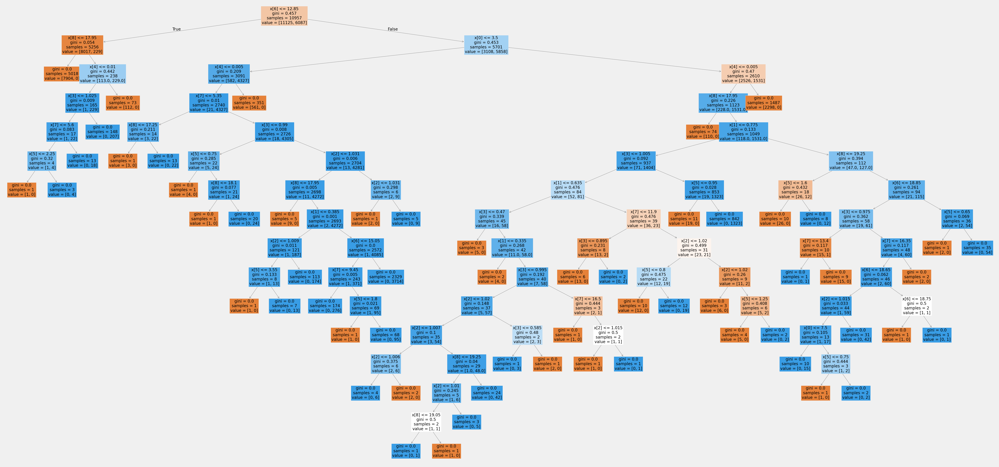

In [212]:
# Plotting one decision tree
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[10], fontsize = 20, filled=True);
plt.show()

In [218]:
# Saving the tree
fig.savefig(os.path.join(path, 'Achievement 2', 'decision_tree_Belgrade.png'), bbox_inches='tight')

In [220]:
# Obtaining feature importances of the model
newarray = clf.feature_importances_
newarray

array([0.03865116, 0.01045479, 0.00910772, 0.03749112, 0.34041022,
       0.11301949, 0.16135547, 0.02757586, 0.26193417])

In [222]:
# Checking the shape of newarray
newarray.shape

(9,)

In [224]:
# Creating a list of observations for Belgrade
belgrade_observations = ['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']
belgrade_observations

['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [226]:
# Obtaining the importances of each observation for Belgrade
important = pd.Series(newarray, index = belgrade_observations)
important

cloud_cover         0.038651
humidity            0.010455
pressure            0.009108
global_radiation    0.037491
precipitation       0.340410
sunshine            0.113019
temp_mean           0.161355
temp_min            0.027576
temp_max            0.261934
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


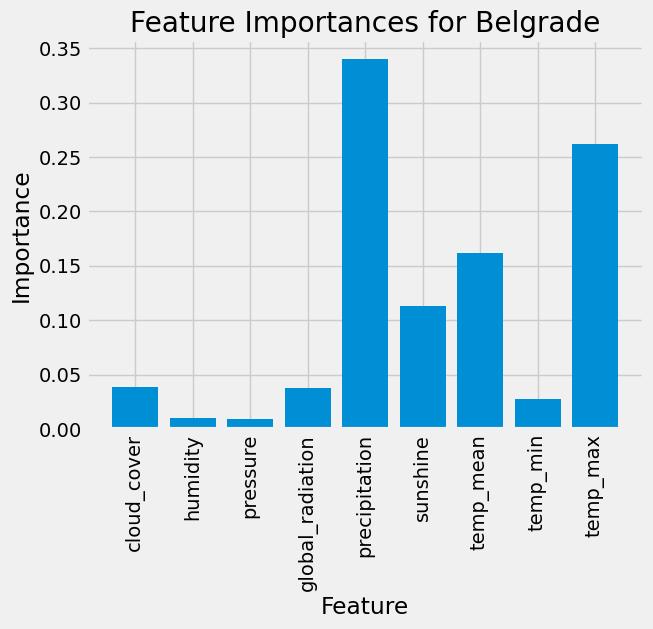

In [228]:
# Creating a bar chart of the importances of each observation for Belgrade
%matplotlib inline

plt.style.use('fivethirtyeight')
x_values = list(range(len(important)))
print(belgrade_observations)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, belgrade_observations, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Feature'); plt.title('Feature Importances for Belgrade');
plt.show()

In [230]:
# Saving the bar chart
plt.savefig(os.path.join(path, 'Achievement 2', 'importances_Belgrade.png'), bbox_inches='tight')

#### 11. Valentia - Subset and random forest model

In [235]:
# Creating a subset with the columns for Valentia
climate_valentia = climate[['VALENTIA_cloud_cover', 'VALENTIA_humidity', 'VALENTIA_pressure', 'VALENTIA_global_radiation', 'VALENTIA_precipitation',
 'VALENTIA_snow_depth', 'VALENTIA_sunshine', 'VALENTIA_temp_mean', 'VALENTIA_temp_min', 'VALENTIA_temp_max']]

In [237]:
# Viewing the first five rows of climate_valentia
climate_valentia.head()

,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,5,0.88,1.0003,0.45,0.34,0,4.7,8.5,6.0,10.9
1,7,0.91,1.0007,0.25,0.84,0,0.7,8.9,5.6,12.1
2,7,0.91,1.0096,0.17,0.08,0,0.1,10.5,8.1,12.9
3,7,0.86,1.0184,0.13,0.98,0,0.0,7.4,7.3,10.6
4,3,0.80,1.0328,0.46,0.00,0,5.7,5.7,3.0,8.4


In [239]:
# Checking the shape of climate_valentia
climate_valentia.shape

(22950, 10)

In [242]:
# Renaming climate_valentia as X and creating y with the columns for Valentia from pleasantweather
X = climate_valentia
y = pleasantweather['VALENTIA_pleasant_weather']

In [244]:
# Converting X and Y into arrays
X = np.array(X)
y = np.array(y)

In [246]:
# Checking the shape of X
X.shape

(22950, 10)

In [248]:
# Checking the shape of y
y.shape

(22950,)

In [250]:
# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [252]:
# Printing the shapes of X_train, X_test, y_train, and y_test
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 10) (17212,)
(5738, 10) (5738,)


In [254]:
# Creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [256]:
# Performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


<Figure size 640x480 with 0 Axes>

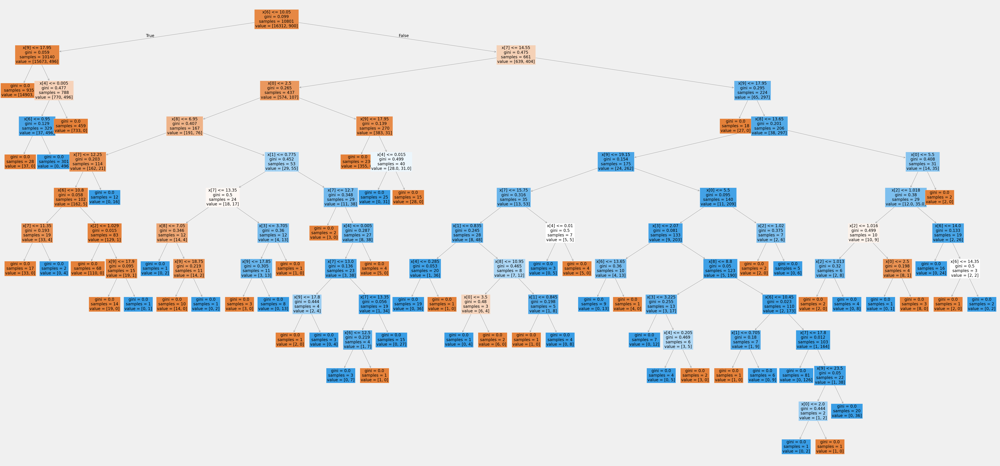

In [258]:
# Plotting one decision tree
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[10], fontsize = 20, filled=True);
plt.show()

In [260]:
# Saving the tree
fig.savefig(os.path.join(path, 'Achievement 2', 'decision_tree_Valentia.png'), bbox_inches='tight')

In [262]:
# Obtaining feature importances of the model
newarray = clf.feature_importances_
newarray

array([0.03945175, 0.00743286, 0.0194763 , 0.03143453, 0.26919102,
       0.        , 0.07320006, 0.10136869, 0.02512834, 0.43331645])

In [264]:
# Checking the shape of newarray
newarray.shape

(10,)

In [266]:
# Creating a list of observations for Valentia
valentia_observations = ['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'snow_depth', 'sunshine', 'temp_mean', 'temp_min',
'temp_max']
valentia_observations

['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'snow_depth',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [268]:
# Obtaining the importances of each observation for Valentia
important = pd.Series(newarray, index = valentia_observations)
important

cloud_cover         0.039452
humidity            0.007433
pressure            0.019476
global_radiation    0.031435
precipitation       0.269191
snow_depth          0.000000
sunshine            0.073200
temp_mean           0.101369
temp_min            0.025128
temp_max            0.433316
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'snow_depth', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


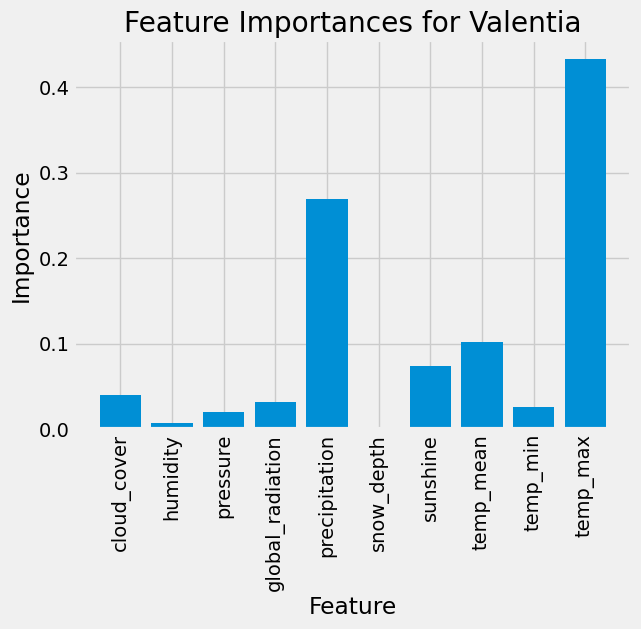

In [270]:
# Creating a bar chart of the importances of each observation for Valentia
%matplotlib inline

plt.style.use('fivethirtyeight')
x_values = list(range(len(important)))
print(valentia_observations)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, valentia_observations, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Feature'); plt.title('Feature Importances for Valentia');
plt.show()

In [272]:
# Saving the bar chart
plt.savefig(os.path.join(path, 'Achievement 2', 'importances_Valentia.png'), bbox_inches='tight')